## User Engegement Analysis

***Expectation***
 - session frequency
 - duration session
 - session total traffic(DL+UL)

#### Import packages


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os

sys.path.append(os.path.abspath(os.path.join("../script")))
from data_clean_handler import CleanData
from get_dataframe_information import DataFrameInformation
from ploting_utils import PlotingUtils


/Users/user/miniforge3/envs/10A/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
import logging
logging.basicConfig(filename='../logfile.log', filemode='a',
                    encoding='utf-8', level=logging.DEBUG)

#### Read the cleaned dataframe 

In [4]:
try:
    df = pd.read_csv('../data/clean_data.csv')
except BaseException:
    logging.error('file not found or wrong format')


/var/folders/6b/0t1qb1d92f72c46kvp35pwfc0000gn/T/ipykernel_5580/1400606392.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../data/clean_data.csv')


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148935 entries, 0 to 148934
Data columns (total 45 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Bearer Id                       148935 non-null  object 
 1   Start                           148935 non-null  object 
 2   Start ms                        148935 non-null  float64
 3   End                             148935 non-null  object 
 4   End ms                          148935 non-null  float64
 5   Dur. (ms)                       148935 non-null  float64
 6   IMSI                            148935 non-null  float64
 7   MSISDN/Number                   148935 non-null  float64
 8   IMEI                            148935 non-null  float64
 9   Last Location Name              148935 non-null  object 
 10  Avg RTT DL (ms)                 148935 non-null  float64
 11  Avg RTT UL (ms)                 148935 non-null  float64
 12  Avg Bearer TP DL

In [6]:
df.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI',
       'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1',
       'Handset Manufacturer', 'Handset Type', 'Nb of sec with Vol DL < 6250B',
       'Nb of sec with Vol UL < 1250B', 'Social Media DL (Bytes)',
       'Social Media UL (Bytes)', 'Google DL (Bytes)', 'Google UL (Bytes)',
       'Email DL (Bytes)', 'Email UL (Bytes)', 'Youtube DL (Bytes)',
       'Youtube UL (Bytes)', 'Netflix DL (Bytes)', 'Netflix UL (Bytes)',
       'Gaming DL (Bytes)', 'Gaming UL (Bytes)', 'Other DL (Bytes)',


In [7]:
to_string = ['IMEI', 'IMSI', 'MSISDN/Number']

for col in to_string:
    df[col] = df[col].astype('category')


In [8]:
from unicodedata import category
df.describe(exclude=[object,'category'])


,Start ms,End ms,Dur. (ms),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
count,148935.000000,148935.000000,1.489350e+05,148935.000000,148935.000000,148935.000000,148935.000000,148935.000000,148935.000000,148935.000000,...,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05
mean,499.246732,498.675442,1.048702e+05,93.334132,15.293235,13286.171390,1770.786497,92.898889,3.043106,1.705449,...,1.163345e+07,1.100867e+07,1.162756e+07,1.100017e+07,4.220256e+08,8.289085e+06,4.211473e+08,8.263189e+06,4.111764e+07,4.546251e+08
std,288.555630,288.089136,8.106343e+04,537.222862,76.683630,23978.591234,4629.475837,13.006268,6.195882,4.149469,...,6.711384e+06,6.345428e+06,6.724686e+06,6.358918e+06,2.439763e+08,4.782090e+06,2.431970e+08,4.768708e+06,1.127933e+07,2.441528e+08
min,0.000000,0.000000,7.142000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.300000e+01,1.050000e+02,4.200000e+01,3.500000e+01,2.516000e+03,5.900000e+01,3.290000e+03,1.480000e+02,2.866892e+06,7.114041e+06
25%,250.000000,251.000000,5.788350e+04,28.000000,3.000000,43.000000,47.000000,91.000000,0.000000,0.000000,...,5.831331e+06,5.516710e+06,5.779947e+06,5.474451e+06,2.104587e+08,4.130162e+06,2.102119e+08,4.145072e+06,3.321774e+07,2.430996e+08
50%,499.000000,500.000000,8.639900e+04,38.000000,5.000000,63.000000,63.000000,100.000000,0.000000,0.000000,...,1.161638e+07,1.101329e+07,1.164269e+07,1.099563e+07,4.234208e+08,8.291222e+06,4.218716e+08,8.266089e+06,4.114101e+07,4.558708e+08
75%,749.000000,750.000000,1.327000e+05,62.000000,11.000000,19681.000000,1117.000000,100.000000,4.000000,1.000000,...,1.744571e+07,1.651442e+07,1.747072e+07,1.650429e+07,6.331620e+08,1.243184e+07,6.316602e+08,1.238204e+07,4.903248e+07,6.656577e+08
max,999.000000,999.000000,1.859336e+06,96923.000000,7120.000000,378160.000000,58613.000000,100.000000,93.000000,100.000000,...,2.325910e+07,2.201196e+07,2.325919e+07,2.201196e+07,8.434419e+08,1.655879e+07,8.434425e+08,1.655882e+07,7.833131e+07,9.029696e+08


### Task 2.1

### A. aggregate session frequeuncy, duration, traffic

1. Duration of the session

In [9]:
total_duration = df.groupby('MSISDN/Number').agg(
    {'Dur. (ms)': 'sum'}).reset_index().rename(columns={'Dur. (ms)': 'total_duration'})

total_duration

,MSISDN/Number,total_duration
0,3.360100e+10,116720.0
1,3.360100e+10,181230.0
2,3.360100e+10,134969.0
3,3.360101e+10,49878.0
4,3.360101e+10,37104.0
...,...,...
106851,3.379000e+10,8810.0
106852,3.379000e+10,140988.0
106853,3.197021e+12,877385.0
106854,3.370000e+14,253030.0


<AxesSubplot:>

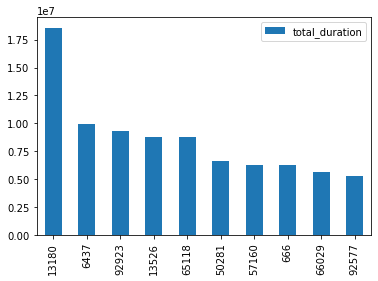

In [10]:
sorted_df = total_duration.sort_values('total_duration',ascending=False)[:10]
sorted_df.plot.bar()


2. Session total traffic 

In [11]:
datainfo = DataFrameInformation(df)
dl_columns = datainfo.get_column_with_string(df, 'DL \(Bytes\)')
total_download = df.groupby(
    'MSISDN/Number').agg({c: 'sum' for c in dl_columns}).sum(axis=1)
total_download = pd.DataFrame(total_download).reset_index().rename(
    columns={0: 'total_download'})
total_download


,MSISDN/Number,total_download
0,3.360100e+10,2.062372e+09
1,3.360100e+10,5.210681e+08
2,3.360100e+10,1.608406e+09
3,3.360101e+10,8.292343e+08
4,3.360101e+10,3.503905e+09
...,...,...
106851,3.379000e+10,1.667242e+09
106852,3.379000e+10,1.093786e+09
106853,3.197021e+12,8.573342e+08
106854,3.370000e+14,1.223624e+09


<AxesSubplot:>

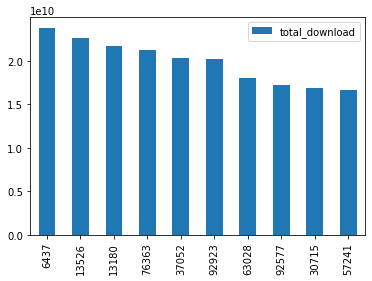

In [12]:
sorted_df = total_download.sort_values('total_download', ascending=False)[:10]
sorted_df.plot.bar()


In [13]:
ul_columns = datainfo.get_column_with_string(df, 'UL \(Bytes\)')
total_upload = df.groupby('MSISDN/Number').agg({c:'sum' for c in ul_columns}).sum(axis=1)
total_upload = pd.DataFrame(total_upload).reset_index().rename(columns={0:'total_upload'})
total_upload

,MSISDN/Number,total_upload
0,3.360100e+10,72106216.0
1,3.360100e+10,72208918.0
2,3.360100e+10,78613640.0
3,3.360101e+10,40655052.0
4,3.360101e+10,188561054.0
...,...,...
106851,3.379000e+10,53432858.0
106852,3.379000e+10,71464486.0
106853,3.197021e+12,74591830.0
106854,3.370000e+14,113305678.0


<AxesSubplot:>

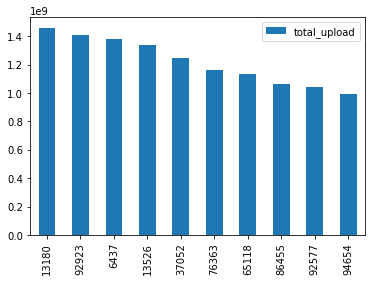

In [14]:
sorted_df = total_upload.sort_values('total_upload', ascending=False)[:10]
sorted_df.plot.bar()

In [15]:
total_traffic = total_download.merge(total_upload, on='MSISDN/Number')
#convert bytes ot Mega Bytes
# cleaner = CleanData(total_traffic)

# total_traffic = cleaner.convert_bytes_to_megabytes(
#     total_traffic, ['total download', 'total upload'])

total_data = pd.DataFrame(total_traffic['MSISDN/Number'])
total_data['total_data'] = total_traffic['total_download'] + total_traffic['total_upload']
total_data


,MSISDN/Number,total_data
0,3.360100e+10,2.134478e+09
1,3.360100e+10,5.932770e+08
2,3.360100e+10,1.687019e+09
3,3.360101e+10,8.698894e+08
4,3.360101e+10,3.692466e+09
...,...,...
106851,3.379000e+10,1.720675e+09
106852,3.379000e+10,1.165251e+09
106853,3.197021e+12,9.319260e+08
106854,3.370000e+14,1.336930e+09


<AxesSubplot:>

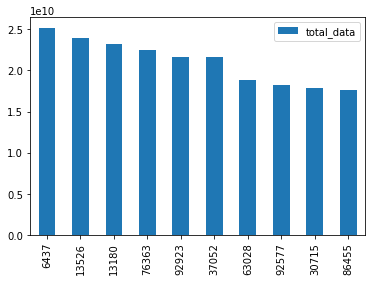

In [16]:
sorted_df = total_data.sort_values('total_data', ascending=False)[:10]
sorted_df.plot.bar()


3. Sessions Frequency

In [17]:
total_freq = df.groupby('MSISDN/Number').agg(
    {'Bearer Id': 'count'}).reset_index().rename(columns={'Bearer Id': 'total_freq'})

total_freq


,MSISDN/Number,total_freq
0,3.360100e+10,1
1,3.360100e+10,1
2,3.360100e+10,1
3,3.360101e+10,1
4,3.360101e+10,2
...,...,...
106851,3.379000e+10,1
106852,3.379000e+10,1
106853,3.197021e+12,1
106854,3.370000e+14,1


<AxesSubplot:>

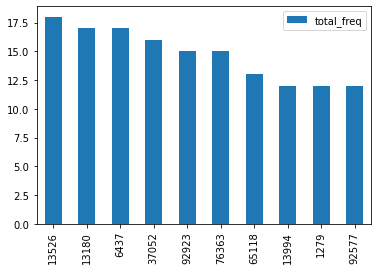

In [18]:
sorted_df = total_freq.sort_values('total_freq', ascending=False)[:10]
sorted_df.plot.bar()


***Put the all the aggregation together***

In [19]:
new_df = total_data.merge(total_duration, on='MSISDN/Number')
new_df = new_df.merge(total_freq, on='MSISDN/Number')
new_df = new_df.select_dtypes(exclude='category')
new_df

,total_data,total_duration,total_freq
0,2.134478e+09,116720.0,1
1,5.932770e+08,181230.0,1
2,1.687019e+09,134969.0,1
3,8.698894e+08,49878.0,1
4,3.692466e+09,37104.0,2
...,...,...,...
106851,1.720675e+09,8810.0,1
106852,1.165251e+09,140988.0,1
106853,9.319260e+08,877385.0,1
106854,1.336930e+09,253030.0,1


### B. Normalization and k-means clustering with k=3

1. mean normalization

In [20]:
normalized_df=(new_df - new_df.mean())/new_df.std()
normalized_df

,total_data,total_duration,total_freq
0,0.127104,-0.158013,-0.488562
1,-1.056093,0.188147,-0.488562
2,-0.216415,-0.060089,-0.488562
3,-0.843735,-0.516687,-0.488562
4,1.323188,-0.585233,0.752099
...,...,...,...
106851,-0.190578,-0.737058,-0.488562
106852,-0.616983,-0.027791,-0.488562
106853,-0.796109,3.923713,-0.488562
106854,-0.485183,0.573426,-0.488562


2. k-means clustering

In [21]:
from sklearn.cluster import KMeans
Kmean = KMeans(n_clusters=3)
Kmean.fit(normalized_df)

centroids = Kmean.cluster_centers_
centroids

array([[-0.4258253 , -0.23267627, -0.47281661],
       [ 0.85505667,  0.34012964,  0.95482439],
       [ 3.37066453,  2.67868292,  3.70700657]])

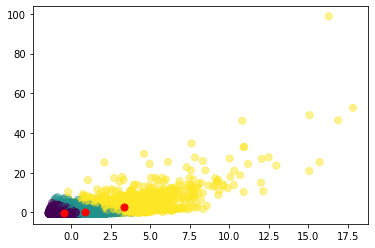

In [22]:
plt.scatter(normalized_df['total_data'], normalized_df['total_duration'],
            c=Kmean.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.show()


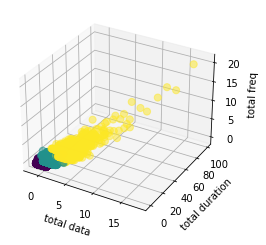

In [23]:
# Create the figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Generate the values
x_vals = normalized_df['total_data']
y_vals = normalized_df['total_duration']
z_vals = normalized_df['total_freq']

# Plot the values
ax.scatter(x_vals, y_vals, z_vals, 
           c=Kmean.labels_.astype(float), s=50, alpha=0.5)
ax.scatter(centroids[:, 0], centroids[:, 1],centroids[:,2], c='red', s=50)

ax.set_xlabel('total data')
ax.set_ylabel('total duration')
ax.set_zlabel('total freq')

plt.show()


In [24]:
import plotly.express as px
fig = px.scatter_3d(normalized_df, x='total_data', y='total_duration', z='total_freq',
                    color=Kmean.labels_.astype(float))

fig = px.scatter_3d(normalized_df, x='total_data', y='total_duration', z='total_freq',
                    color=Kmean.labels_.astype(float))
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()


### C. Minimum, maximum, average, total  

In [25]:
new_df.describe()

,total_data,total_duration,total_freq
count,1.068560e+05,1.068560e+05,106856.000000
mean,1.968916e+09,1.461672e+05,1.393792
std,1.302573e+09,1.863587e+05,0.806022
min,1.154361e+08,7.142000e+03,1.000000
25%,1.147453e+09,7.130800e+04,1.000000
50%,1.696816e+09,1.027400e+05,1.000000
75%,2.319111e+09,1.727990e+05,2.000000
max,2.518775e+10,1.855375e+07,18.000000


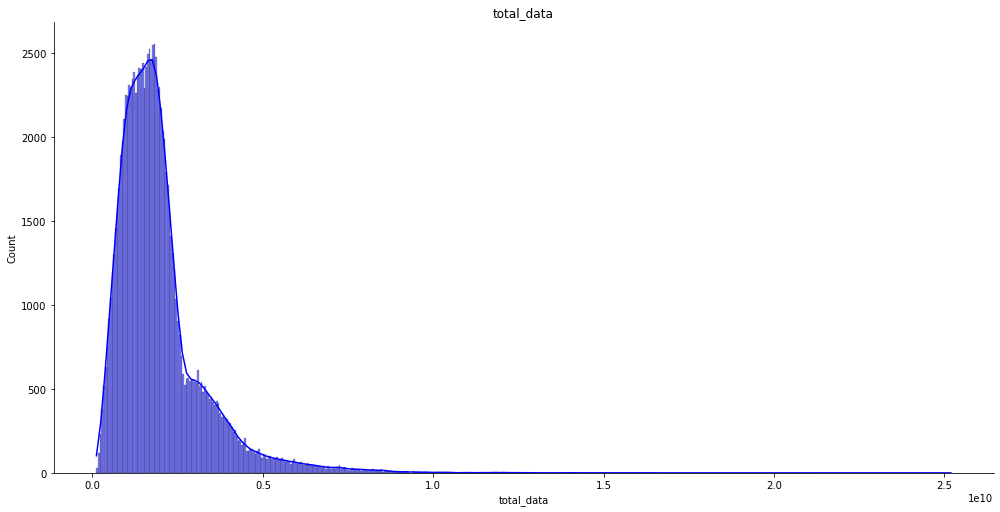

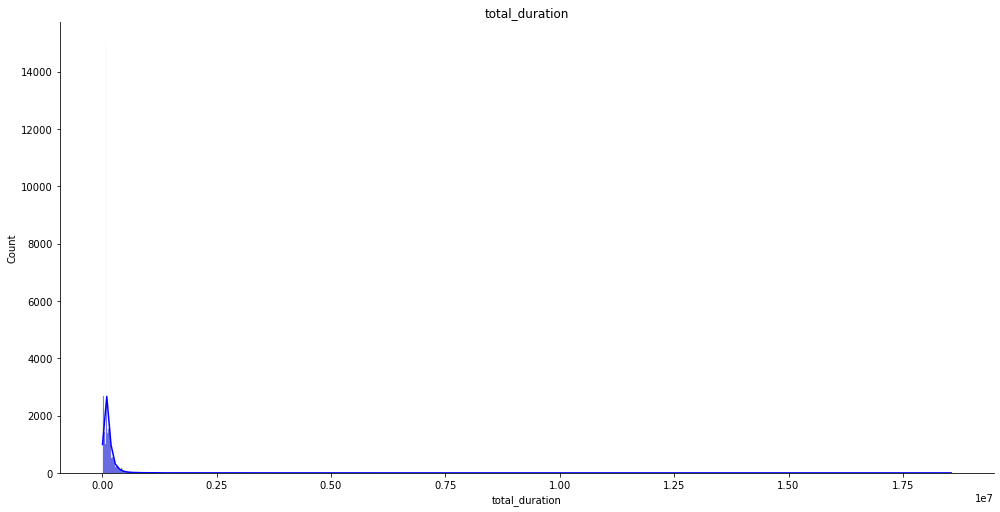

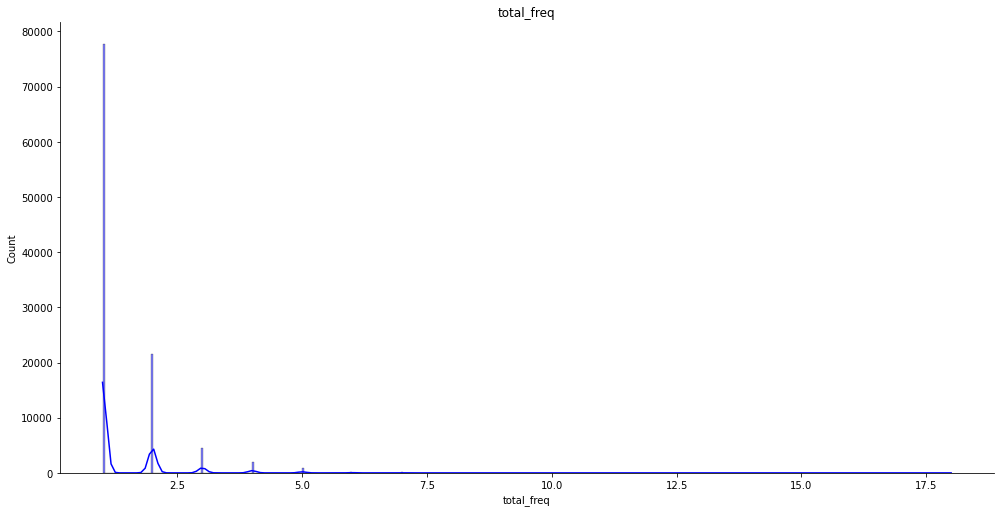

In [26]:
from turtle import color


pltu = PlotingUtils(new_df)
pltu.plot_many_hist(new_df,new_df.columns,color='blue')

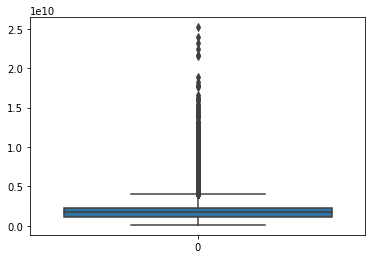

In [27]:
ax = sns.boxplot(data=new_df['total_data'])


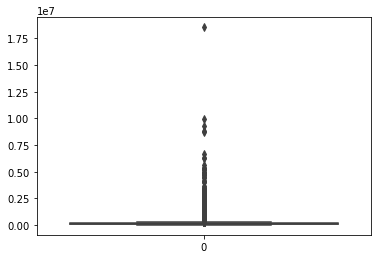

In [28]:
ax = sns.boxplot(data=new_df['total_duration'])


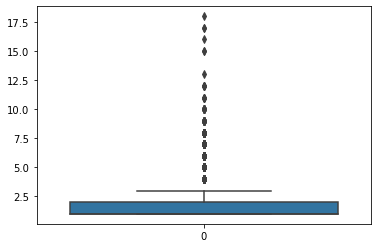

In [29]:
ax = sns.boxplot(data=new_df['total_freq'])


### D. Aggregate user total traffic per application

1. aggregate

In [30]:
selected_columns = datainfo.get_column_with_string(df,'Bytes')
app_df = df[['MSISDN/Number']+selected_columns]
app_df 

,MSISDN/Number,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,3.366496e+10,1545765.0,24420.0,1634479.0,1271433.0,3563542.0,137762.0,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,3.368185e+10,1926113.0,7165.0,3493924.0,920172.0,629046.0,308339.0,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,3.376063e+10,1684053.0,42224.0,8535055.0,1694064.0,2690151.0,672973.0,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,3.375034e+10,644121.0,13372.0,9023734.0,2788027.0,1439754.0,631229.0,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,3.369980e+10,862600.0,50188.0,6248284.0,1500559.0,1936496.0,173853.0,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148930,3.366865e+10,962097.0,31078.0,1139573.0,126061.0,3459965.0,820142.0,6550499.0,18003146.0,22468983.0,7149728.0,784435351.0,12724751.0,321383162.0,14890486.0,53745392.0,819016468.0
148931,3.365069e+10,3464974.0,52091.0,9967603.0,2817311.0,57639.0,633237.0,16191667.0,11763428.0,17883703.0,19678161.0,526609673.0,9197207.0,3264510.0,13487416.0,57628851.0,574175259.0
148932,3.366345e+10,2344568.0,7613.0,2229420.0,2185941.0,1954414.0,167304.0,13877234.0,8288284.0,19350146.0,21293148.0,626893062.0,4735033.0,712180387.0,2457758.0,39135081.0,666648844.0
148933,3.362189e+10,1245845.0,14394.0,3850890.0,2734579.0,1525734.0,532543.0,22660510.0,1855903.0,9963942.0,5065760.0,553539484.0,13394316.0,121100856.0,11314729.0,34912224.0,592786405.0


In [44]:
paired_columns = []

for i in range(len(selected_columns)//2):
    paired_columns.append( [selected_columns[2*i],selected_columns[2*i+1]])
paired_columns

[['Social Media DL (Bytes)', 'Social Media UL (Bytes)'],
 ['Google DL (Bytes)', 'Google UL (Bytes)'],
 ['Email DL (Bytes)', 'Email UL (Bytes)'],
 ['Youtube DL (Bytes)', 'Youtube UL (Bytes)'],
 ['Netflix DL (Bytes)', 'Netflix UL (Bytes)'],
 ['Gaming DL (Bytes)', 'Gaming UL (Bytes)'],
 ['Other DL (Bytes)', 'Other UL (Bytes)'],
 ['Total UL (Bytes)', 'Total DL (Bytes)']]

In [45]:
agg_app_df = app_df.groupby('MSISDN/Number').agg({c:'sum' for c in selected_columns})
agg_app_df = agg_app_df.reset_index()
agg_app_df 

,MSISDN/Number,Social Media DL (Bytes),Social Media UL (Bytes),Google DL (Bytes),Google UL (Bytes),Email DL (Bytes),Email UL (Bytes),Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,3.360100e+10,2206504.0,25631.0,3337123.0,1051882.0,837400.0,493962.0,14900201.0,6724347.0,10265105.0,16915876.0,8.110911e+08,1367528.0,377096990.0,9473882.0,36053108.0,8.426375e+08
1,3.360100e+10,2598548.0,62017.0,4197697.0,1137166.0,2828821.0,478960.0,5324251.0,7107972.0,770569.0,10451194.0,1.050353e+08,14714780.0,279557701.0,2152370.0,36104459.0,1.207552e+08
2,3.360100e+10,3148004.0,47619.0,3343483.0,99643.0,2436500.0,768880.0,2137272.0,19196298.0,16525919.0,2827981.0,5.290685e+08,9759228.0,495086501.0,6607171.0,39306820.0,5.566597e+08
3,3.360101e+10,251469.0,28825.0,5937765.0,3740728.0,2178618.0,106052.0,4393123.0,2584198.0,1157362.0,784730.0,3.880748e+08,3051292.0,25248001.0,10031701.0,20327526.0,4.019932e+08
4,3.360101e+10,2861230.0,51312.0,13728668.0,4770948.0,2247808.0,1057661.0,10339971.0,31193031.0,24971647.0,24230077.0,1.308981e+09,5816727.0,777643713.0,27160771.0,94280527.0,1.363130e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
106851,3.379000e+10,234320.0,65863.0,6834178.0,697091.0,480946.0,525969.0,8294310.0,18353533.0,14754741.0,147797.0,6.573267e+08,3034642.0,291391283.0,3891534.0,26716429.0,6.879252e+08
106852,3.379000e+10,442214.0,56355.0,1472406.0,3957299.0,2513433.0,664.0,5596862.0,14254710.0,6929961.0,1601099.0,4.276202e+08,9383076.0,204636073.0,6479040.0,35732243.0,4.445751e+08
106853,3.197021e+12,668596.0,46628.0,8572779.0,1865881.0,842279.0,678492.0,9839889.0,2120016.0,10340908.0,16251392.0,1.645636e+08,13485133.0,467678100.0,2848373.0,37295915.0,1.948281e+08
106854,3.370000e+14,496337.0,25229.0,8215537.0,1615080.0,2989663.0,328919.0,16690728.0,20044212.0,9983678.0,20921364.0,5.012590e+08,8883653.0,144354057.0,4834382.0,56652839.0,5.396350e+08


In [47]:
total_df = pd.DataFrame()
total_df['MSISDN/Number'] = agg_app_df['MSISDN/Number']
for col in paired_columns:
    total_df[col[0].split(' ')[0]] = agg_app_df[col[0]] + agg_app_df[col[1]]
total_df

,MSISDN/Number,Social,Google,Email,Youtube,Netflix,Gaming,Other,Total
0,3.360100e+10,2232135.0,4389005.0,1331362.0,21624548.0,27180981.0,8.124587e+08,386570872.0,8.786906e+08
1,3.360100e+10,2660565.0,5334863.0,3307781.0,12432223.0,11221763.0,1.197501e+08,281710071.0,1.568596e+08
2,3.360100e+10,3195623.0,3443126.0,3205380.0,21333570.0,19353900.0,5.388277e+08,501693672.0,5.959665e+08
3,3.360101e+10,280294.0,9678493.0,2284670.0,6977321.0,1942092.0,3.911261e+08,35279702.0,4.223207e+08
4,3.360101e+10,2912542.0,18499616.0,3305469.0,41533002.0,49201724.0,1.314798e+09,804804484.0,1.457411e+09
...,...,...,...,...,...,...,...,...,...
106851,3.379000e+10,300183.0,7531269.0,1006915.0,26647843.0,14902538.0,6.603614e+08,295282817.0,7.146416e+08
106852,3.379000e+10,498569.0,5429705.0,2514097.0,19851572.0,8531060.0,4.370033e+08,211115113.0,4.803073e+08
106853,3.197021e+12,715224.0,10438660.0,1520771.0,11959905.0,26592300.0,1.780487e+08,470526473.0,2.321240e+08
106854,3.370000e+14,521566.0,9830617.0,3318582.0,36734940.0,30905042.0,5.101427e+08,149188439.0,5.962878e+08


2. top 10 most engaged user per applications

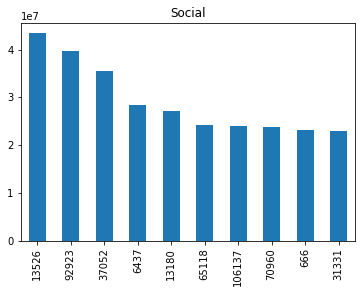

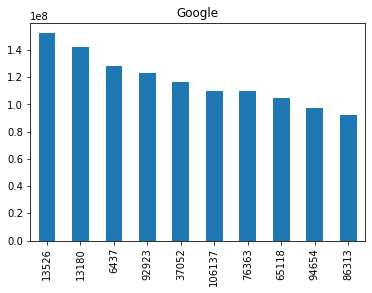

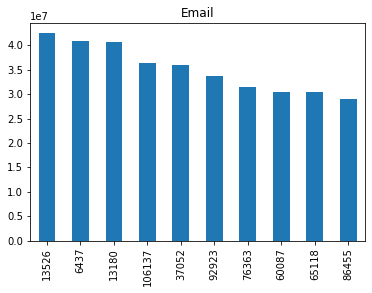

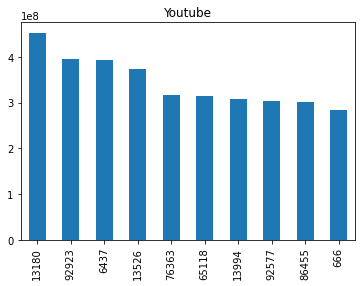

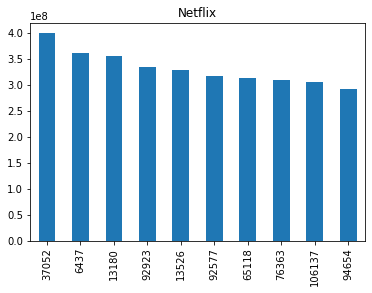

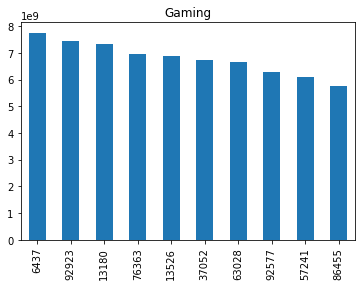

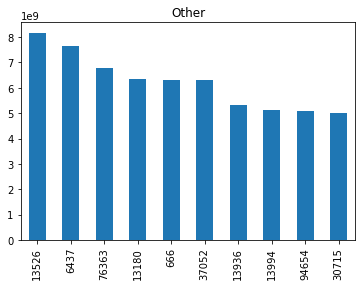

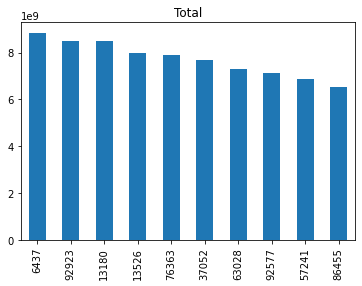

In [50]:
for col in total_df.columns[1:]:
    total_df.sort_values(col,ascending=False)[col][:10].plot(kind='bar',title=col)
    plt.show()

### E. Top 3 most used application

In [80]:
sum_df = total_df.loc[:, total_df.columns != 'MSISDN/Number']
sum_df = sum_df.loc[:, sum_df.columns != 'Total']
sum_df = pd.DataFrame(sum_df.sum(),columns=['sum']).sort_values('sum',ascending=False)
sum_df

,sum
Gaming,6.408892e+13
Other,6.395425e+13
Youtube,3.372204e+12
Netflix,3.370060e+12
Google,1.162853e+12
Email,3.364677e+11
Social,2.722655e+11


<AxesSubplot:>

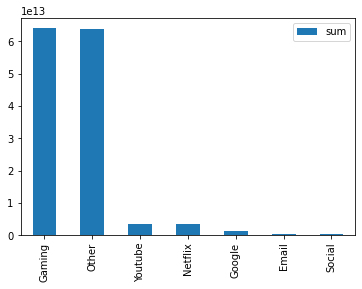

In [81]:
sum_df.plot.bar()


### F. K-mean clustering - optimized k values 

In [90]:
seg_eng_df = total_df.loc[:, total_df.columns != 'Total']
seg_eng_df = seg_eng_df.loc[:, seg_eng_df.columns != 'MSISDN/Number']
seg_eng_df


,Social,Google,Email,Youtube,Netflix,Gaming,Other
0,2232135.0,4389005.0,1331362.0,21624548.0,27180981.0,8.124587e+08,386570872.0
1,2660565.0,5334863.0,3307781.0,12432223.0,11221763.0,1.197501e+08,281710071.0
2,3195623.0,3443126.0,3205380.0,21333570.0,19353900.0,5.388277e+08,501693672.0
3,280294.0,9678493.0,2284670.0,6977321.0,1942092.0,3.911261e+08,35279702.0
4,2912542.0,18499616.0,3305469.0,41533002.0,49201724.0,1.314798e+09,804804484.0
...,...,...,...,...,...,...,...
106851,300183.0,7531269.0,1006915.0,26647843.0,14902538.0,6.603614e+08,295282817.0
106852,498569.0,5429705.0,2514097.0,19851572.0,8531060.0,4.370033e+08,211115113.0
106853,715224.0,10438660.0,1520771.0,11959905.0,26592300.0,1.780487e+08,470526473.0
106854,521566.0,9830617.0,3318582.0,36734940.0,30905042.0,5.101427e+08,149188439.0


In [92]:
normalized_seg_eng_df = (seg_eng_df-seg_eng_df.mean())/seg_eng_df.std()
normalized_seg_eng_df


,Social,Google,Email,Youtube,Netflix,Gaming,Other
0,-0.165527,-0.860643,-0.817780,-0.466489,-0.204671,0.473538,-0.472104
1,0.059013,-0.735278,0.071538,-0.898157,-0.954297,-1.068726,-0.705687
2,0.339436,-0.986010,0.025461,-0.480154,-0.572320,-0.135681,-0.215661
3,-1.188484,-0.159571,-0.388825,-1.154317,-1.390176,-0.464528,-1.254625
4,0.191073,1.009585,0.070497,0.468403,0.829674,1.591958,0.459536
...,...,...,...,...,...,...,...
106851,-1.178060,-0.444165,-0.963769,-0.230598,-0.781406,0.134904,-0.675453
106852,-1.074086,-0.722708,-0.285592,-0.549747,-1.080683,-0.362386,-0.862942
106853,-0.960538,-0.058818,-0.732553,-0.920337,-0.232322,-0.938929,-0.285088
106854,-1.062034,-0.139408,0.076398,0.243088,-0.029747,-0.199546,-1.000887


In [93]:
from sklearn.cluster import KMeans
Kmean = KMeans(n_clusters=3)
Kmean.fit(normalized_seg_eng_df)

centroids = Kmean.cluster_centers_
centroids


array([[-0.37253679, -0.40012365, -0.39214548, -0.40951485, -0.41112053,
        -0.36937378, -0.37138696],
       [ 2.8410096 ,  3.06941383,  3.02943217,  3.15027543,  3.12589691,
         2.84680055,  2.85051668],
       [ 0.73442125,  0.78564079,  0.76624894,  0.80253135,  0.81212875,
         0.72293235,  0.7289448 ]])

### Elbow Method
1. Distortion: It is calculated as the average of the squared distances from the cluster centers of the respective clusters. Typically, the Euclidean distance metric is used.
2. Inertia: It is the sum of squared distances of samples to their closest cluster center.

We iterate the values of k from 1 to 9 and calculate the values of distortions for each value of k and calculate the distortion and inertia for each value of k in the given range.

To determine the optimal number of clusters, we have to select the value of k at the “elbow” ie the point after which the distortion/inertia start decreasing in a linear fashion. Thus for the given data, we conclude that the optimal number of clusters for the data is 3.

In [95]:
from sklearn.cluster import KMeans
from sklearn import metrics
from scipy.spatial.distance import cdist

distortions = []
inertias = []
mapping1 = {}
mapping2 = {}
K = range(1, 10)

for k in K:
    # Building and fitting the model
    kmeanModel = KMeans(n_clusters=k).fit(normalized_seg_eng_df)
    kmeanModel.fit(normalized_seg_eng_df)

    distortions.append(sum(np.min(cdist(normalized_seg_eng_df, kmeanModel.cluster_centers_,
                                        'euclidean'), axis=1)) / normalized_seg_eng_df.shape[0])
    inertias.append(kmeanModel.inertia_)

    mapping1[k] = sum(np.min(cdist(normalized_seg_eng_df, kmeanModel.cluster_centers_,
                                   'euclidean'), axis=1)) / normalized_seg_eng_df.shape[0]
    mapping2[k] = kmeanModel.inertia_


In [97]:

for key, val in mapping1.items():
    print(f'{key} : {val}')


1 : 2.1408110650391885
2 : 1.673809530136638
3 : 1.5253792474936176
4 : 1.485463704924585
5 : 1.4204306927609618
6 : 1.3783741342013855
7 : 1.3656042520626404
8 : 1.3435182283656584
9 : 1.3095782816624586


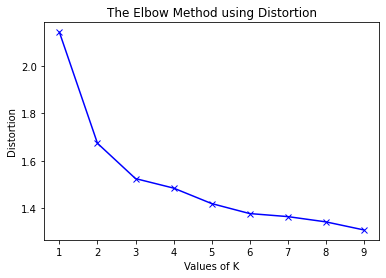

In [98]:
plt.plot(K, distortions, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Distortion')
plt.title('The Elbow Method using Distortion')
plt.show()


In [99]:
for key, val in mapping2.items():
    print(f'{key} : {val}')


1 : 747984.9999999988
2 : 421564.83724617073
3 : 304581.2338258495
4 : 275421.83262370777
5 : 257906.74790855296
6 : 247147.8877890744
7 : 234441.3650187943
8 : 225914.3135779101
9 : 217565.42676252354


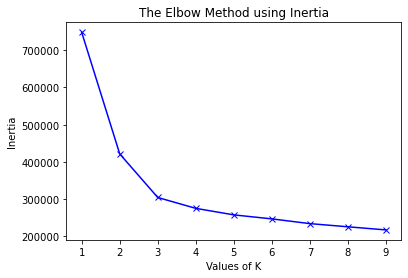

In [100]:
plt.plot(K, inertias, 'bx-')
plt.xlabel('Values of K')
plt.ylabel('Inertia')
plt.title('The Elbow Method using Inertia')
plt.show()


To determine the optimal number of clusters, we have to select the value of k at the “elbow” ie the point after which the distortion/inertia start decreasing in a linear fashion. Thus for the given data, we conclude that the optimal number of clusters for the data is 3.